In [3]:
import collections
from etils import epath
from ml_collections import config_dict
import matplotlib.pyplot as plt
import numpy as np
import tensorflow as tf
from tqdm import tqdm
import pandas as pd

from chirp import audio_utils
from chirp.inference import a2o_utils
from chirp.inference import interface
from chirp.inference import tf_examples
from chirp.inference import models
from chirp.models import metrics
from chirp.taxonomy import namespace
from chirp.inference.search import bootstrap
from chirp.inference.search import search
from chirp.inference.search import display
from chirp.inference.classify import classify
from chirp.inference.classify import data_lib
import requests
import json
import pickle
import sys
from scipy.io import wavfile
import os

2024-06-09 15:44:45.630900: I tensorflow/core/platform/cpu_feature_guard.cc:210] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 AVX512F FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.
2024-06-09 15:44:46.902943: W tensorflow/compiler/tf2tensorrt/utils/py_utils.cc:38] TF-TRT Warning: Could not find TensorRT


In [23]:
# load embedding config
working_dir =  '.'
embeddings_path = epath.Path(working_dir) / 'embeddings'
labeled_data_path = epath.Path(working_dir) / 'labeled_outputs'
custom_classifier_path = epath.Path(working_dir) / 'custom_classifier'
bootstrap_config = bootstrap.BootstrapConfig.load_from_embedding_path(
      embeddings_path=embeddings_path,
      annotated_path=labeled_data_path)

project_state = bootstrap.BootstrapState(
    bootstrap_config, a2o_auth_token='')
window_s = bootstrap_config.model_config['window_size_s']
sample_rate = bootstrap_config.model_config['sample_rate']

In [17]:
# get species list, put in codes list
species_list = pd.read_csv('./custom_classifier/birds.csv', low_memory=False)
# get the scientific names using eBird
checklist = pd.read_csv('./custom_classifier/eBird_checklist.csv', low_memory=False)[['species_code', 'scientific name']]
species_list = species_list.merge(checklist)
species_list = species_list.rename(columns={'scientific name': 'scientific_name'})
species_list = species_list.to_dict('records')

In [ ]:
# use xenocanto api to gather 50 recordings per species
def get_xenocanto_recordings(scientific_name: str) -> list[str]:
    endpoint: string = f'https://xeno-canto.org/api/2/recordings?query={scientific_name}'
    response = requests.get(endpoint).json()
    # get the ids
    ids: list[str] = []
    for recording in response['recordings']:
        ids.append(f"xc{recording['id']}")
    return ids

for species in species_list:
    xeno_ids = get_xenocanto_recordings(species['scientific_name'])
    species['xenocanto_ids'] = xeno_ids

In [99]:
# save the species_list obj to disk to not use xenocanto api everytime
# with open('./custom_classifier/species_list.pkl', 'wb') as f:
#     pickle.dump(species_list, f)

In [4]:
with open('./custom_classifier/species_list.pkl', 'rb') as f:
    species_list = pickle.load(f)

In [26]:
# TESTING
# try different download settings

# audio = audio_utils.load_xc_audio('xc878437', sample_rate = -1)
# peaks = audio_utils.slice_peaked_audio(audio, sample_rate_hz=sample_rate, interval_length_s=window_s)
# audio_slice = audio[peaks[0][0]:peaks[0][1]]
# testing_filepath = epath.Path("./target_recordings/westan_xc878437_testing.wav")
# with testing_filepath.open("wb") as f:
#     wavfile.write(f, sample_rate, np.float32(audio_slice))

In [5]:
# first convert the species list into a list of recordings we can iterate over

recordings = []
for species in species_list:
    for i, xeno_id in enumerate(species['xenocanto_ids']):
        if i < 10:
            recordings.append({'xc_id': xeno_id, 'species_code': species['species_code']})

In [6]:
# find the peaks in the audio, where the bird is most likely vocalizing

existing_recordings = []
for root, dirs, files in os.walk("./labeled_outputs/", topdown=False):
    for file in files:
        if file.endswith('.wav') and file.startswith('xc'):
            xc_id = file.split('_')[0]
            if xc_id not in existing_recordings:
                existing_recordings.append(xc_id)

for recording in tqdm(recordings):
    if recording['xc_id'] in existing_recordings:
        continue
    try:
        audio = audio_utils.load_xc_audio(recording['xc_id'], sample_rate = sample_rate)
        peaks = audio_utils.slice_peaked_audio(audio, sample_rate_hz=sample_rate, interval_length_s=window_s)
        for i, peak in enumerate(peaks):
            audio_slice = audio[peak[0]:peak[1]]
            labeled_data_path = epath.Path(labeled_data_path)
            label_path = epath.Path(recording['species_code'])
            output_path = labeled_data_path / label_path
            output_path.mkdir(parents=True, exist_ok=True)
            filename = epath.Path(f"{recording['xc_id']}_{i}.wav")
            output_filepath = output_path / filename
            with output_filepath.open('wb') as f:
                wavfile.write(f, sample_rate, np.float32(audio_slice))
    except:
        print(f'error in xc id {recording["xc_id"]}') # due to restricted recordings

 77%|████████████████████████████████████▏          | 640/830 [18:39<19:12,  6.06s/it]Note: Illegal Audio-MPEG-Header 0x00000000 at offset 16124.
Note: Trying to resync...
Note: Hit end of (available) data during resync.
 77%|████████████████████████████████████▎          | 641/830 [18:40<13:59,  4.44s/it]

error in xc id xc402430


Note: Illegal Audio-MPEG-Header 0x00000000 at offset 16124.
Note: Trying to resync...
Note: Hit end of (available) data during resync.
 77%|████████████████████████████████████▎          | 642/830 [18:41<10:21,  3.31s/it]

error in xc id xc773195


Note: Illegal Audio-MPEG-Header 0x00000000 at offset 16124.
Note: Trying to resync...
Note: Hit end of (available) data during resync.
 77%|████████████████████████████████████▍          | 643/830 [18:41<07:50,  2.51s/it]

error in xc id xc631015


Note: Illegal Audio-MPEG-Header 0x00000000 at offset 16124.
Note: Trying to resync...
Note: Hit end of (available) data during resync.
 78%|████████████████████████████████████▍          | 644/830 [18:42<06:04,  1.96s/it]

error in xc id xc625705


Note: Illegal Audio-MPEG-Header 0x00000000 at offset 16124.
Note: Trying to resync...
Note: Hit end of (available) data during resync.
 78%|████████████████████████████████████▌          | 645/830 [18:43<04:49,  1.57s/it]

error in xc id xc613776


Note: Illegal Audio-MPEG-Header 0x00000000 at offset 16124.
Note: Trying to resync...
Note: Hit end of (available) data during resync.
 78%|████████████████████████████████████▌          | 646/830 [18:43<03:57,  1.29s/it]

error in xc id xc586966


Note: Illegal Audio-MPEG-Header 0x00000000 at offset 16124.
Note: Trying to resync...
Note: Hit end of (available) data during resync.
 78%|████████████████████████████████████▋          | 647/830 [18:44<03:21,  1.10s/it]

error in xc id xc586965


Note: Illegal Audio-MPEG-Header 0x00000000 at offset 16124.
Note: Trying to resync...
Note: Hit end of (available) data during resync.
 78%|████████████████████████████████████▋          | 648/830 [18:45<03:22,  1.11s/it]

error in xc id xc586963


Note: Illegal Audio-MPEG-Header 0x00000000 at offset 16124.
Note: Trying to resync...
Note: Hit end of (available) data during resync.
 78%|████████████████████████████████████▊          | 649/830 [18:46<02:56,  1.03it/s]

error in xc id xc487244


Note: Illegal Audio-MPEG-Header 0x00000000 at offset 16124.
Note: Trying to resync...
Note: Hit end of (available) data during resync.
 78%|████████████████████████████████████▊          | 650/830 [18:46<02:38,  1.14it/s]

error in xc id xc447586


 84%|███████████████████████████████████████▍       | 697/830 [23:17<23:09, 10.45s/it]/home/mschulist/miniconda3/lib/python3.10/site-packages/scipy/signal/_wavelets.py:555: RuntimeWarning: Use of fft convolution on input with NAN or inf results in NAN or inf output. Consider using method='direct' instead.
  output[ind] = convolve(data, wavelet_data, mode='same')
 87%|████████████████████████████████████████▉      | 723/830 [26:25<09:41,  5.43s/it]/home/mschulist/miniconda3/lib/python3.10/site-packages/scipy/signal/_wavelets.py:555: RuntimeWarning: Use of fft convolution on input with NAN or inf results in NAN or inf output. Consider using method='direct' instead.
  output[ind] = convolve(data, wavelet_data, mode='same')
100%|███████████████████████████████████████████████| 830/830 [37:24<00:00,  2.70s/it]


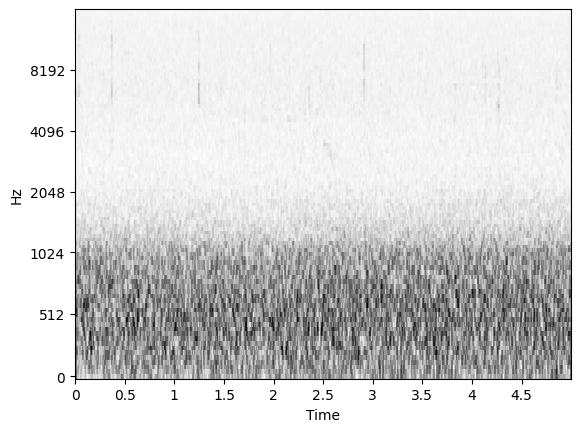

In [256]:
# get some unknown calls, audio snippets of nothing

unknown_audio = audio_utils.load_audio_file('./ARU_data/10-BLACK/Data/BLACK-10-CAP_20230604_090000.wav', sample_rate)
start = int(54 * sample_rate)
end = start + int(5 * sample_rate)
unknown_audio_snippet = unknown_audio[start:end]
display.plot_audio_melspec(unknown_audio_snippet, sample_rate)
outputs = project_state.embedding_model.embed(unknown_audio_snippet)
query = outputs.pooled_embeddings('first', 'first')

In [257]:
# search for unknown calls

top_k = 50 

target_score = 2

metric = 'mip' 

random_sample = True

ds = project_state.create_embeddings_dataset(shuffle_files=True)
results, all_scores = search.search_embeddings_parallel(
    ds, query,
    hop_size_s=bootstrap_config.embedding_hop_size_s,
    top_k=top_k, target_score=target_score, score_fn=metric,
    random_sample=random_sample)

14912it [00:10, 1423.60it/s]


In [ ]:
samples_per_page = 15
page_state = display.PageState(
    np.ceil(len(results.search_results) / samples_per_page))

display.display_paged_results(
    results, page_state, samples_per_page,
    project_state=project_state,
    embedding_sample_rate=project_state.embedding_model.sample_rate,
    exclusive_labels=False,
    checkbox_labels=['unknown'],
    max_workers=5,
)

In [74]:
results.write_labeled_data(bootstrap_config.annotated_path,
                           project_state.embedding_model.sample_rate)

Wrote 13 examples for label unknown


In [4]:
# TESTING---check out the embeddings written below
training_embeds = data_lib.read_embedded_dataset(
    labeled_data_path, 
    './labeled_outputs/embeddings-4fd5b578b32840554972/embeddings-1715213176-00000-of-00001',
    time_pooling='mean'
)

In [5]:
training_embeds

(['amedip',
  'amekes',
  'amepip',
  'amerob',
  'annhum',
  'batpig1',
  'belkin1',
  'bkbwoo',
  'bkhgro',
  'blkpho',
  'brebla',
  'brespa',
  'brncre',
  'btywar',
  'buffle',
  'bushti',
  'calhum',
  'cangoo',
  'casfin',
  'casvir',
  'chispa',
  'clanut',
  'commer',
  'comnig',
  'comrav',
  'cowscj1',
  'daejun',
  'dusfly',
  'flaowl',
  'foxspa',
  'gadwal',
  'gcrfin',
  'gnttow',
  'gockin',
  'grhowl',
  'hamfly',
  'herthr',
  'herwar',
  'houwre',
  'lazbun',
  'lesgol',
  'linspa',
  'macwar',
  'moublu',
  'mouchi',
  'mouqua',
  'naswar',
  'nopowl',
  'norfli',
  'nswowl',
  'olsfly',
  'pacwre1',
  'pilwoo',
  'pinsis',
  'purfin',
  'rebnut',
  'rebsap',
  'redcro',
  'rethaw',
  'rocwre',
  'rufhum',
  'shshaw',
  'sonspa',
  'soogro1',
  'sposan',
  'spotow',
  'stejay',
  'swathr',
  'towsol',
  'treswa',
  'turvul',
  'unknown',
  'vigswa',
  'warvir',
  'westan',
  'wewpew',
  'whbnut',
  'whcspa',
  'whtpta1',
  'whtswi',
  'wilsap',
  'wlswar',
  'yerwar

In [31]:
# train smaller model

merged = data_lib.MergedDataset.from_folder_of_folders(
    base_dir=labeled_data_path,
    embedding_model=project_state.embedding_model,
    time_pooling='mean',
    load_audio=False,
    target_sample_rate=sample_rate,
    audio_file_pattern='*',
    embedding_config_hash=bootstrap_config.embedding_config_hash(),
)

lbl_counts = np.sum(merged.data['label_hot'], axis=0)
print('num classes :', (lbl_counts > 0).sum())
print('mean ex / class :', lbl_counts.sum() / (lbl_counts > 0).sum())
print('min ex / class :', (lbl_counts + (lbl_counts == 0) * 1e6).min())

Embedding from Folder of Folders...
Checking for existing embeddings from Folder of Folders...
Found 0 existing embeddings.
Checking for new sources to embed from Folder of Folders...


45it [00:00, 79.22it/s]
45it [00:00, 86.48it/s]
27it [00:00, 80.07it/s]
49it [00:00, 81.41it/s]
45it [00:00, 85.44it/s]
27it [00:00, 78.49it/s]
38it [00:00, 78.77it/s]
43it [00:00, 82.34it/s]
50it [00:00, 83.75it/s]
41it [00:00, 85.24it/s]
50it [00:00, 82.71it/s]
43it [00:00, 80.68it/s]
47it [00:00, 80.14it/s]
46it [00:00, 78.88it/s]
35it [00:00, 78.22it/s]
44it [00:00, 75.87it/s]
34it [00:00, 84.51it/s]
44it [00:00, 92.07it/s]
50it [00:00, 99.64it/s] 
47it [00:00, 110.68it/s]
34it [00:00, 108.60it/s]
45it [00:00, 108.72it/s]
45it [00:00, 105.50it/s]
50it [00:00, 106.40it/s]
50it [00:00, 107.09it/s]
44it [00:00, 106.08it/s]
46it [00:00, 117.00it/s]
49it [00:00, 97.56it/s] 
50it [00:00, 103.14it/s]
44it [00:00, 123.23it/s]
41it [00:00, 118.30it/s]
21it [00:00, 114.70it/s]
46it [00:00, 121.30it/s]
42it [00:00, 120.17it/s]
44it [00:00, 122.11it/s]
48it [00:00, 122.70it/s]
49it [00:00, 121.21it/s]
43it [00:00, 124.23it/s]
41it [00:00, 126.86it/s]
45it [00:00, 128.65it/s]
48it [00:00, 126.8


...embedded dataset in 33.32s...
    found 83 classes.
    class amedip / 0 : 45
    class amekes / 1 : 45
    class amepip / 2 : 27
    class amerob / 3 : 49
    class annhum / 4 : 45
    class batpig1 / 5 : 27
    class belkin1 / 6 : 38
    class bkbwoo / 7 : 43
    class bkhgro / 8 : 50
    class blkpho / 9 : 41
    class brebla / 10 : 50
    class brespa / 11 : 43
    class brncre / 12 : 47
    class btywar / 13 : 46
    class buffle / 14 : 35
    class bushti / 15 : 44
    class calhum / 16 : 34
    class cangoo / 17 : 44
    class casfin / 18 : 50
    class casvir / 19 : 47
    class chispa / 20 : 34
    class clanut / 21 : 45
    class commer / 22 : 45
    class comnig / 23 : 50
    class comrav / 24 : 50
    class cowscj1 / 25 : 44
    class daejun / 26 : 46
    class dusfly / 27 : 49
    class flaowl / 28 : 50
    class foxspa / 29 : 44
    class gadwal / 30 : 41
    class gcrfin / 31 : 21
    class gnttow / 32 : 46
    class gockin / 33 : 42
    class grhowl / 34 : 44
    cl

In [8]:
train_ratio = 0.9 
train_examples_per_class = None  

num_seeds = 1 

# Classifier training hyperparams.
# These should be good defaults.
batch_size = 32
num_epochs = 128
num_hiddens = -1
learning_rate = 1e-3

metrics = collections.defaultdict(list)
for seed in tqdm(range(num_seeds)):
  if num_hiddens > 0:
    model = classify.get_two_layer_model(
        num_hiddens, merged.embedding_dim, merged.num_classes, True)
  else:
    model = classify.get_linear_model(
        merged.embedding_dim, merged.num_classes)
  run_metrics = classify.train_embedding_model(
      model, merged, train_ratio, train_examples_per_class,
      num_epochs, seed, batch_size, learning_rate)
  metrics['acc'].append(run_metrics.top1_accuracy)
  metrics['auc_roc'].append(run_metrics.auc_roc)
  metrics['cmap'].append(run_metrics.cmap_value)
  metrics['maps'].append(run_metrics.class_maps)
  metrics['test_logits'].append(run_metrics.test_logits)

mean_acc = np.mean(metrics['acc'])
mean_auc = np.mean(metrics['auc_roc'])
mean_cmap = np.mean(metrics['cmap'])
# Merge the test_logits into a single array.
test_logits = {
    k: np.concatenate([logits[k] for logits in metrics['test_logits']])
    for k in metrics['test_logits'][0].keys()
}

print(f'acc:{mean_acc:5.2f}, auc_roc:{mean_auc:5.2f}, cmap:{mean_cmap:5.2f}')
for lbl, auc in zip(merged.labels, run_metrics.class_maps):
  if np.isnan(auc):
    continue
  print(f'\n{lbl:8s}, auc_roc:{auc:5.2f}')

  0%|                                                           | 0/3 [00:00<?, ?it/s]2024-05-08 14:02:51.159671: I tensorflow/core/framework/local_rendezvous.cc:421] Local rendezvous recv item cancelled. Key hash: 12892677471142123921
2024-05-08 14:02:51.159774: I tensorflow/core/framework/local_rendezvous.cc:425] Local rendezvous send item cancelled. Key hash: 1860057254032368482
2024-05-08 14:02:51.159796: I tensorflow/core/framework/local_rendezvous.cc:421] Local rendezvous recv item cancelled. Key hash: 3529049550304879387
2024-05-08 14:02:51.159838: I tensorflow/core/framework/local_rendezvous.cc:421] Local rendezvous recv item cancelled. Key hash: 7121011427868388120
2024-05-08 14:08:07.548520: I tensorflow/core/framework/local_rendezvous.cc:421] Local rendezvous recv item cancelled. Key hash: 15907940761269200185
 33%|████████████████▋                                 | 1/3 [05:27<10:55, 327.58s/it]2024-05-08 14:08:14.271350: I tensorflow/core/framework/local_rendezvous.cc:421] 

acc: 0.95, auc_roc: 1.00, cmap: 0.96

amedip  , auc_roc: 1.00

amekes  , auc_roc: 1.00

amepip  , auc_roc: 1.00

amerob  , auc_roc: 1.00

annhum  , auc_roc: 1.00

batpig1 , auc_roc: 0.97

belkin1 , auc_roc: 1.00

bkbwoo  , auc_roc: 1.00

bkhgro  , auc_roc: 1.00

blkpho  , auc_roc: 1.00

brebla  , auc_roc: 1.00

brespa  , auc_roc: 1.00

brncre  , auc_roc: 1.00

btywar  , auc_roc: 1.00

buffle  , auc_roc: 1.00

bushti  , auc_roc: 1.00

calhum  , auc_roc: 0.98

cangoo  , auc_roc: 1.00

casfin  , auc_roc: 1.00

casvir  , auc_roc: 1.00

chispa  , auc_roc: 1.00

clanut  , auc_roc: 1.00

commer  , auc_roc: 1.00

comnig  , auc_roc: 1.00

comrav  , auc_roc: 1.00

cowscj1 , auc_roc: 1.00

daejun  , auc_roc: 1.00

dusfly  , auc_roc: 1.00

flaowl  , auc_roc: 1.00

foxspa  , auc_roc: 0.97

gadwal  , auc_roc: 1.00

gcrfin  , auc_roc: 1.00

gnttow  , auc_roc: 1.00

gockin  , auc_roc: 1.00

grhowl  , auc_roc: 1.00

hamfly  , auc_roc: 1.00

herthr  , auc_roc: 1.00

herwar  , auc_roc: 1.00

houwre  , au

In [9]:
output_filepath = epath.Path(working_dir) / epath.Path('outputs') / 'inference.csv'

class_thresholds = None # write all logits

include_classes = [] # if empty, includes all classes
exclude_classes = []

embeddings_ds = project_state.create_embeddings_dataset(
    shuffle_files=True)
classify.write_inference_csv(
    embeddings_ds=embeddings_ds,
    model=model,
    labels=merged.labels,
    output_filepath=output_filepath,
    threshold=class_thresholds,
    embedding_hop_size_s=bootstrap_config.embedding_hop_size_s,
    include_classes=include_classes,
    exclude_classes=exclude_classes)

14912it [12:05, 20.55it/s]





   Detection count:  221204794
NonDetection count:  0


In [10]:
classified = pd.read_csv('./outputs/inference.csv', skipinitialspace=True)
classified

,filename,timestamp_s,label,logit
0,10-BLACK/Data/BLACK-10-CAP_20230608_003000.wav,0.0,amedip,-13.71
1,10-BLACK/Data/BLACK-10-CAP_20230608_003000.wav,0.0,amekes,-12.57
2,10-BLACK/Data/BLACK-10-CAP_20230608_003000.wav,0.0,amepip,-12.89
3,10-BLACK/Data/BLACK-10-CAP_20230608_003000.wav,0.0,amerob,-12.13
4,10-BLACK/Data/BLACK-10-CAP_20230608_003000.wav,0.0,annhum,-9.35
...,...,...,...,...
221204789,11-MYOTIS/Data/11-MYOTIS_20230609_013000.wav,890.0,whtpta1,-8.42
221204790,11-MYOTIS/Data/11-MYOTIS_20230609_013000.wav,890.0,whtswi,-9.06
221204791,11-MYOTIS/Data/11-MYOTIS_20230609_013000.wav,890.0,wilsap,-11.70
221204792,11-MYOTIS/Data/11-MYOTIS_20230609_013000.wav,890.0,wlswar,-8.39


In [11]:
classified.to_parquet('./outputs/classified.parquet.gzip')

In [12]:
top_one = classified.groupby(['filename'])['logit'].max()
top_one

filename
1-CLEAR_mini/Data/1-CLEAR_20230528_073253.wav        -0.28
1-CLEAR_mini/Data/1-CLEAR_20230528_073437.wav         1.29
1-CLEAR_mini/Data/1-CLEAR_20230528_080000.wav         5.57
1-CLEAR_mini/Data/1-CLEAR_20230528_083000.wav         5.79
1-CLEAR_mini/Data/1-CLEAR_20230528_090000.wav         6.78
                                                      ... 
D4-RED-CAPLE/Data/D4-RED-CAPLE_20230620_043000.wav    5.68
D4-RED-CAPLE/Data/D4-RED-CAPLE_20230620_050000.wav    5.81
D4-RED-CAPLE/Data/D4-RED-CAPLE_20230620_053000.wav    5.59
D4-RED-CAPLE/Data/D4-RED-CAPLE_20230620_060000.wav    4.98
D4-RED-CAPLE/Data/D4-RED-CAPLE_20230620_063000.wav    4.16
Name: logit, Length: 14912, dtype: float64

In [76]:
top_one = classified.loc[classified.groupby(['filename', 'timestamp_s'])['logit'].idxmax()]
top_one

,filename,timestamp_s,label,logit
53455036,1-CLEAR_mini/Data/1-CLEAR_20230528_073253.wav,0.0,norfli,-2.10
53455119,1-CLEAR_mini/Data/1-CLEAR_20230528_073253.wav,5.0,norfli,-4.14
53455160,1-CLEAR_mini/Data/1-CLEAR_20230528_073253.wav,10.0,belkin1,-3.93
53455243,1-CLEAR_mini/Data/1-CLEAR_20230528_073253.wav,15.0,belkin1,-2.92
53455326,1-CLEAR_mini/Data/1-CLEAR_20230528_073253.wav,20.0,belkin1,-3.36
...,...,...,...,...
43315522,D4-RED-CAPLE/Data/D4-RED-CAPLE_20230620_063000...,870.0,soogro1,-2.37
43315605,D4-RED-CAPLE/Data/D4-RED-CAPLE_20230620_063000...,875.0,soogro1,1.08
43315688,D4-RED-CAPLE/Data/D4-RED-CAPLE_20230620_063000...,880.0,soogro1,0.76
43315771,D4-RED-CAPLE/Data/D4-RED-CAPLE_20230620_063000...,885.0,soogro1,-1.16


In [ ]:
top_one['label'].unique()

In [78]:
top_one.to_parquet('top_one_classified.parquet.gzip')

In [80]:
len(top_one[top_one['label'] == 'unknown']) / len(top_one)

0.8073507439445458

In [92]:
classified[(classified['label'] == 'stejay') & (classified['logit'] > 0)]

,filename,timestamp_s,label,logit
849073,10-BLACK/Data/BLACK-10-CAP_20230612_193000.wav,130.0,stejay,23.49
854219,10-BLACK/Data/BLACK-10-CAP_20230612_193000.wav,440.0,stejay,14.46
2398351,10-BLACK/Data/BLACK-10-CAP_20230605_163000.wav,380.0,stejay,0.85
2420927,10-BLACK/Data/BLACK-10-CAP_20230613_010000.wav,845.0,stejay,14.04
3399829,10-BLACK/Data/BLACK-10-CAP_20230612_183000.wav,745.0,stejay,15.56
3693068,10-BLACK/Data/BLACK-10-CAP_20230612_180000.wav,335.0,stejay,6.27
3701451,10-BLACK/Data/BLACK-10-CAP_20230612_180000.wav,840.0,stejay,5.14
5965027,10-BLACK/Data/BLACK-10-CAP_20230612_230000.wav,265.0,stejay,8.78
6215106,10-BLACK/Data/BLACK-10-CAP_20230612_190000.wav,115.0,stejay,7.92
6218509,10-BLACK/Data/BLACK-10-CAP_20230612_190000.wav,320.0,stejay,14.76


In [17]:
above_zero_classified = classified[classified['logit'] > 0]
above_zero_classified

,filename,timestamp_s,label,logit
237,10-BLACK/Data/BLACK-10-CAP_20230608_003000.wav,10.0,unknown,0.44
320,10-BLACK/Data/BLACK-10-CAP_20230608_003000.wav,15.0,unknown,1.91
486,10-BLACK/Data/BLACK-10-CAP_20230608_003000.wav,25.0,unknown,0.66
569,10-BLACK/Data/BLACK-10-CAP_20230608_003000.wav,30.0,unknown,0.43
652,10-BLACK/Data/BLACK-10-CAP_20230608_003000.wav,35.0,unknown,1.14
...,...,...,...,...
221204450,11-MYOTIS/Data/11-MYOTIS_20230609_013000.wav,870.0,unknown,6.24
221204533,11-MYOTIS/Data/11-MYOTIS_20230609_013000.wav,875.0,unknown,6.56
221204616,11-MYOTIS/Data/11-MYOTIS_20230609_013000.wav,880.0,unknown,4.73
221204699,11-MYOTIS/Data/11-MYOTIS_20230609_013000.wav,885.0,unknown,7.04


In [18]:
above_zero_classified.to_parquet('./outputs/above_zero_classified.parquet.gzip')

In [20]:
above_zero_classified[above_zero_classified['label'] == 'herwar']

,filename,timestamp_s,label,logit
342246,10-BLACK/Data/BLACK-10-CAP_20230614_080000.wav,30.0,herwar,0.71
574314,10-BLACK/Data/BLACK-10-CAP_20230612_210000.wav,585.0,herwar,0.74
849044,10-BLACK/Data/BLACK-10-CAP_20230612_193000.wav,130.0,herwar,21.54
854190,10-BLACK/Data/BLACK-10-CAP_20230612_193000.wav,440.0,herwar,13.90
899259,10-BLACK/Data/BLACK-10-CAP_20230609_190000.wav,470.0,herwar,0.05
...,...,...,...,...
213837087,5-GREEN-5-CAPL/Data/GREEN-5-CAPL_20230612_0930...,90.0,herwar,0.86
214612805,5-GREEN-5-CAPL/Data/GREEN-5-CAPL_20230613_0730...,280.0,herwar,0.23
217212946,11-MYOTIS/Data/11-MYOTIS_20230611_180000.wav,530.0,herwar,36.40
217604540,11-MYOTIS/Data/11-MYOTIS_20230611_163000.wav,850.0,herwar,0.45


In [ ]:
random_audio = audio_utils.load_audio_file('./ARU_data/D4-RED-CAPLE/Data/D4-RED-CAPLE_20230619_030000.wav', sample_rate)
start = int(280 * sample_rate)
end = start + int(5 * sample_rate)
random_audio_snippet = random_audio[start:end]
display.plot_audio_melspec(random_audio_snippet, sample_rate)

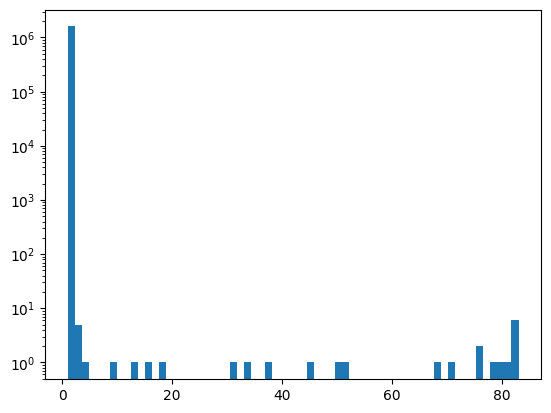

In [21]:
# a lot of instances where it assigns high logits to ev
x = above_zero_classified.groupby(['filename', 'timestamp_s']).count()
# x = x[x['logit'] > 2]
plt.hist(x['logit'], bins=64, log=True)
plt.show()

species: daejun, logit: 35.0, filename: 11-MYOTIS/Data/11-MYOTIS_20230611_180000.wav, offset: 530.0


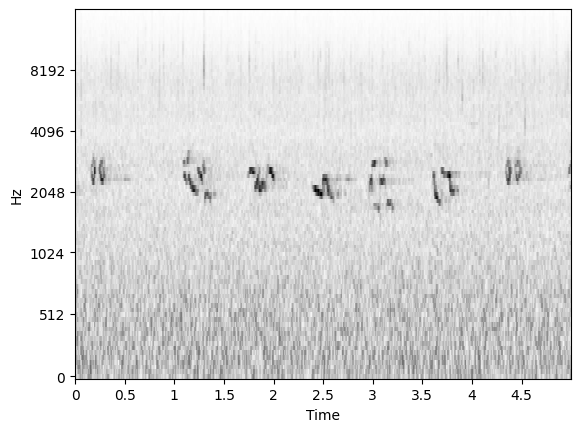

species: daejun, logit: 25.26, filename: 6-BLUE-6-CAP/Data/BLUE-6-CAP_20220604_190000.wav, offset: 505.0


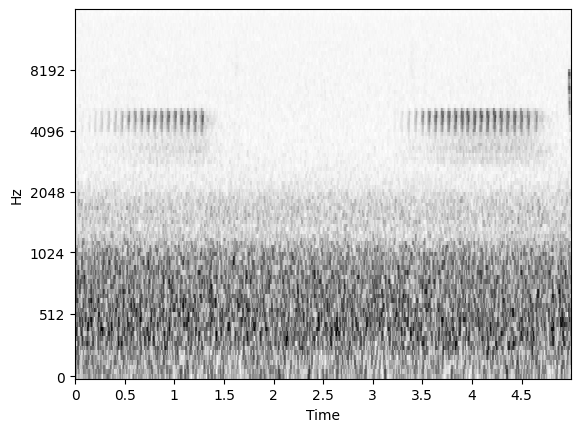

species: daejun, logit: 25.13, filename: 2-WHITE_mini/Data/2-WHITE_20230529_173000.wav, offset: 70.0


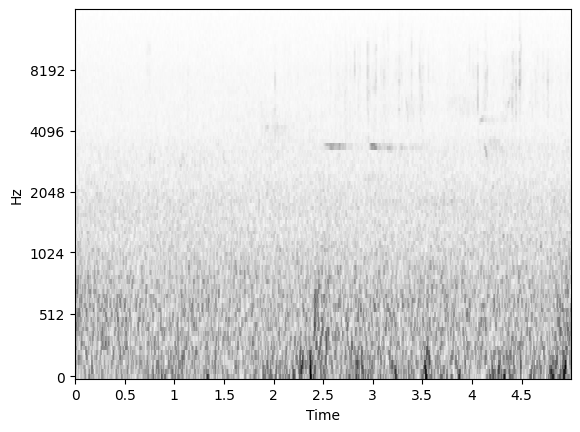

species: daejun, logit: 25.06, filename: 3-Yellow_mini/Data/3-YELLOW_20230605_160000.wav, offset: 125.0


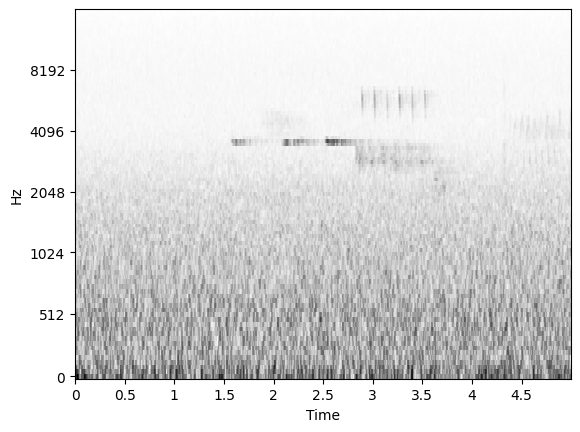

species: daejun, logit: 24.19, filename: 20_PARROT/Data/20-PARROT_20230604_050000.wav, offset: 45.0


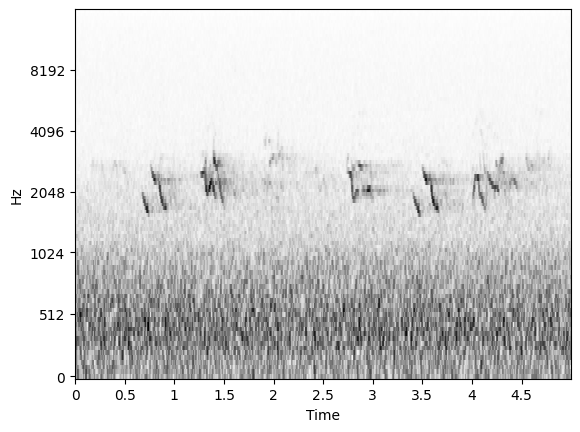

species: daejun, logit: 21.3, filename: 10-BLACK/Data/BLACK-10-CAP_20230612_193000.wav, offset: 130.0


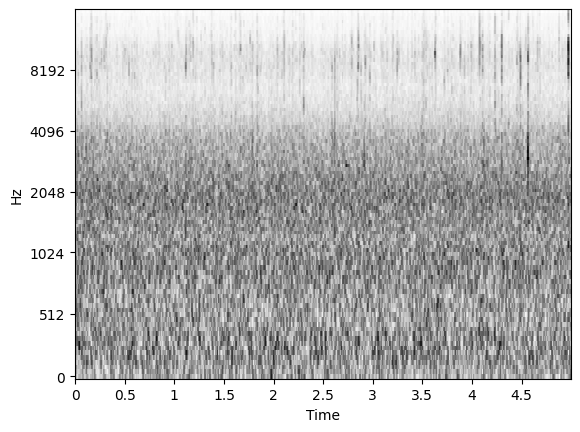

In [26]:
def show_classified_spec(filename, offset_s, sample_rate):
    audio = audio_utils.load_audio(filename, sample_rate)
    start = int(offset_s * sample_rate)
    end = start + int(5 * sample_rate)
    audio_snippet = audio[start:end]
    display.plot_audio_melspec(audio_snippet, sample_rate)

def show_spec_classified_species(species, classified, n, audio_path, sample_rate):
    filtered = classified[classified['label'] == species]
    filtered = filtered.sort_values(by=['logit'], ascending=False)
    for i, window in enumerate(filtered.iterrows()):
        if i < n:
            filename = window[1]['filename']
            offset_s = window[1]['timestamp_s']
            logit = window[1]['logit']
            print(f'species: {species}, logit: {logit}, filename: {filename}, offset: {offset_s}')
            show_classified_spec(f'./{audio_path}/{filename}', offset_s, sample_rate)


show_spec_classified_species('daejun', above_zero_classified, 6, 'ARU_data', sample_rate)

./labeled_outputs/daejun/xc878339_0.wav


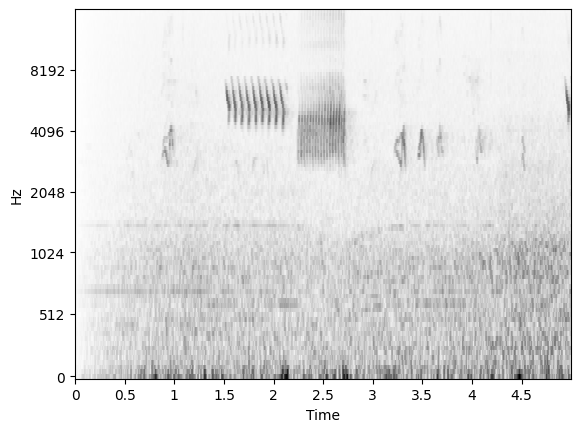

./labeled_outputs/daejun/xc817988_2.wav


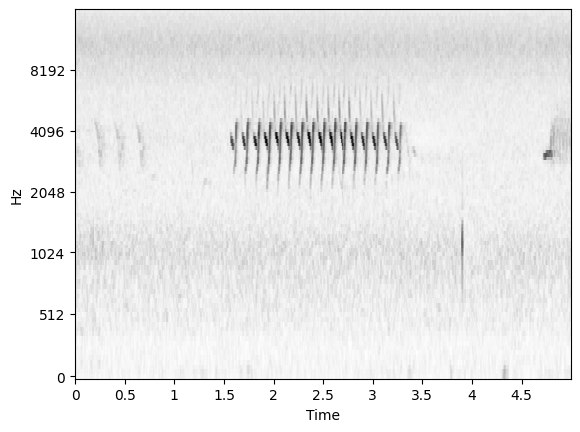

./labeled_outputs/daejun/xc857049_0.wav


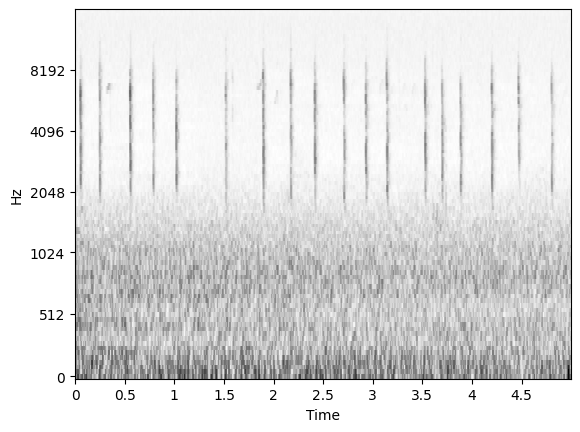

./labeled_outputs/daejun/xc502158_3.wav


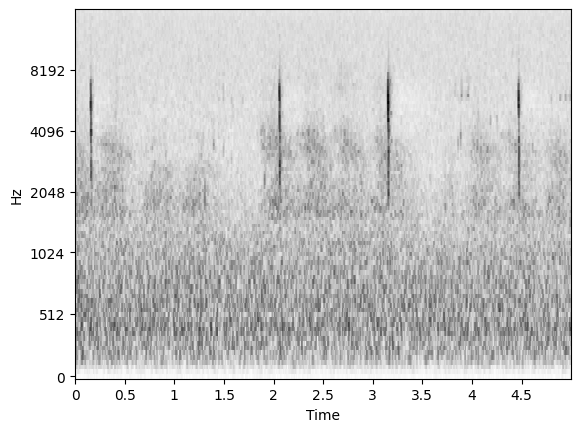

./labeled_outputs/daejun/xc502158_4.wav


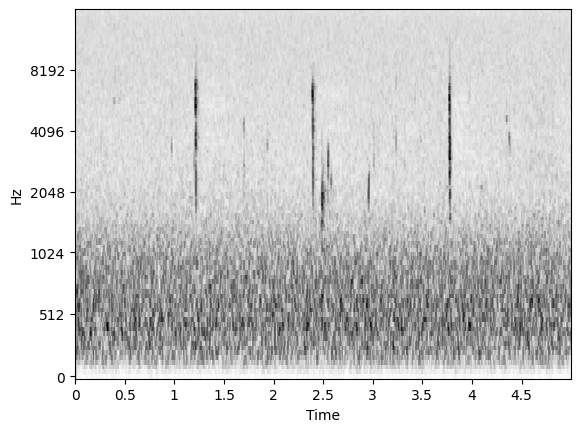

In [27]:
def show_spec_training(species, n, training_path, sample_rate):
    path = f'./{training_path}/{species}'
    audio_files = os.listdir(path)
    for i, audio_file in enumerate(audio_files):
        if i < n:
            audio = audio_utils.load_audio(f'{path}/{audio_file}', sample_rate)
            print(f'{path}/{audio_file}')
            display.plot_audio_melspec(audio, sample_rate)

show_spec_training('daejun', 5, 'labeled_outputs', sample_rate)

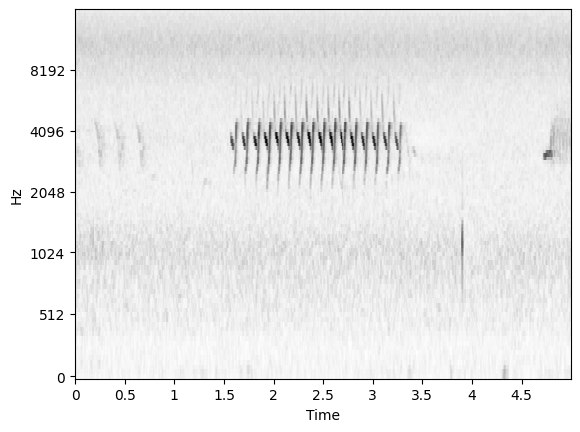

In [28]:
# searching for ARU recordings similar to a particular xc example
train_audio = audio_utils.load_audio_file('./labeled_outputs/daejun/xc817988_2.wav', sample_rate)
display.plot_audio_melspec(train_audio, sample_rate)
outputs = project_state.embedding_model.embed(train_audio)
xc_query = outputs.pooled_embeddings('first', 'first')

In [7]:
len(train_audio)

160000

Results Page: 0 / 16


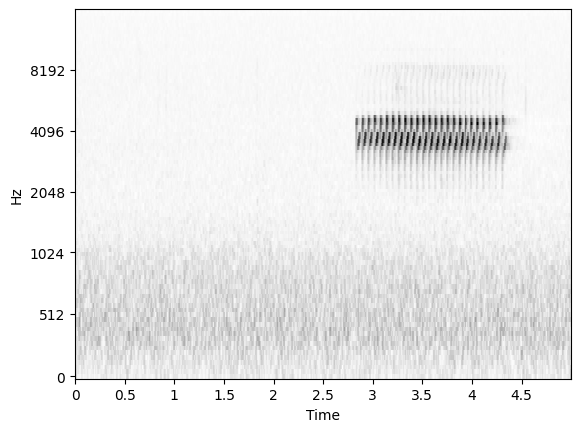

rank        : 0
source file : C3-YELLOW-CAP/Data/C3-YELLOW-CA_20230617_203000.wav
offset_s    : 545.00
score       : 3.87
--------------------------------------------------------------------------------


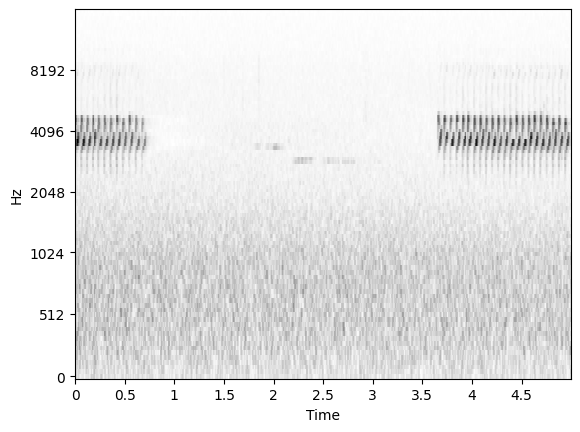

rank        : 1
source file : C3-YELLOW-CAP/Data/C3-YELLOW-CA_20230619_083000.wav
offset_s    : 255.00
score       : 3.83
--------------------------------------------------------------------------------


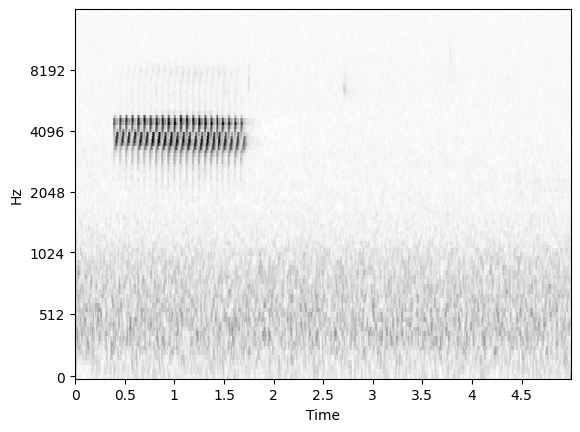

rank        : 2
source file : C3-YELLOW-CAP/Data/C3-YELLOW-CA_20230617_203000.wav
offset_s    : 565.00
score       : 3.75
--------------------------------------------------------------------------------
Results Page: 0 / 16


Button(description='Prev Page', style=ButtonStyle())

Button(description='Next Page', style=ButtonStyle())

In [29]:
# search for embeddings similar to that of a westan training example

top_k = 50 

target_score = None

metric = 'mip' 

random_sample = False

ds = project_state.create_embeddings_dataset(shuffle_files=True)
results, all_scores = search.search_embeddings_parallel(
    ds, xc_query,
    hop_size_s=bootstrap_config.embedding_hop_size_s,
    top_k=top_k, target_score=target_score, score_fn=metric,
    random_sample=random_sample)

samples_per_page = 3
page_state = display.PageState(
    np.ceil(len(results.search_results) / samples_per_page))

display.display_paged_results(
    results, page_state, samples_per_page,
    project_state=project_state,
    embedding_sample_rate=project_state.embedding_model.sample_rate,
    exclusive_labels=False,
    checkbox_labels=[],
    max_workers=5,
)

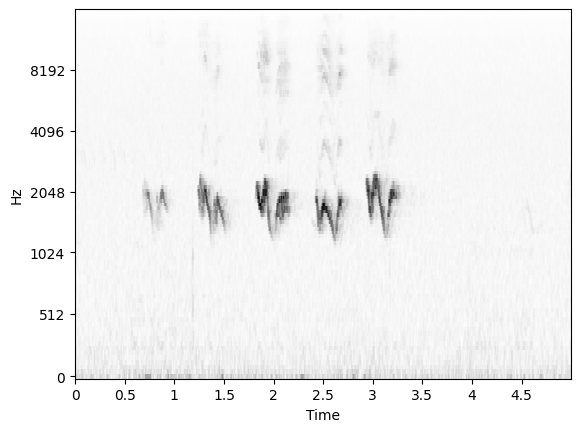

In [27]:
train_audio = audio_utils.load_audio_file('./target_recordings/westan_xc878437_testing.wav', sample_rate)
train_audio = train_audio[0:int(5 * sample_rate)]
display.plot_audio_melspec(train_audio, sample_rate)
outputs = project_state.embedding_model.embed(train_audio)
tar_query = outputs.pooled_embeddings('first', 'first')

Results Page: 0 / 16


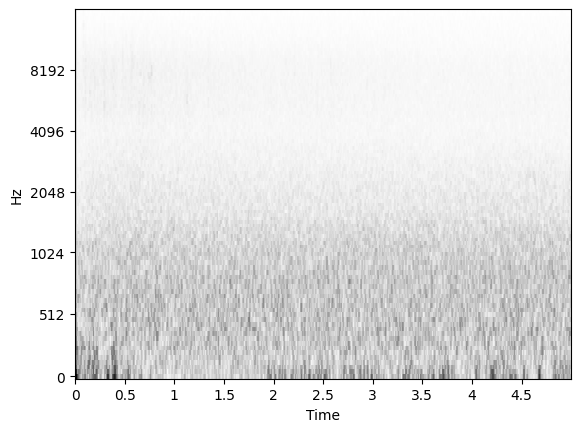

rank        : 0
source file : 17-ENSATINA/Data/17-ENSATINA_20230617_160000.wav
offset_s    : 205.00
score       : 4.57
--------------------------------------------------------------------------------


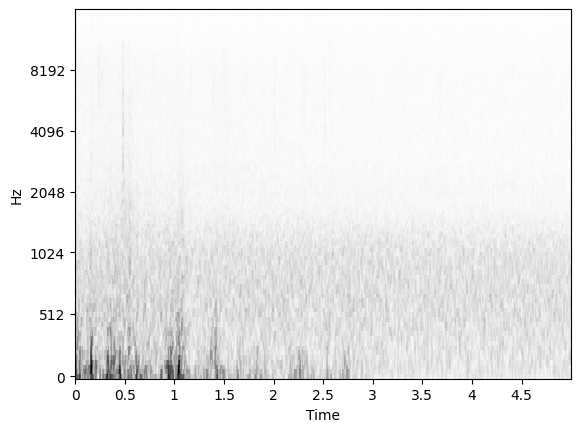

rank        : 1
source file : 13-COTTONTAIL/Data/13-COTNTAIL_20230616_083000.wav
offset_s    : 710.00
score       : 4.57
--------------------------------------------------------------------------------


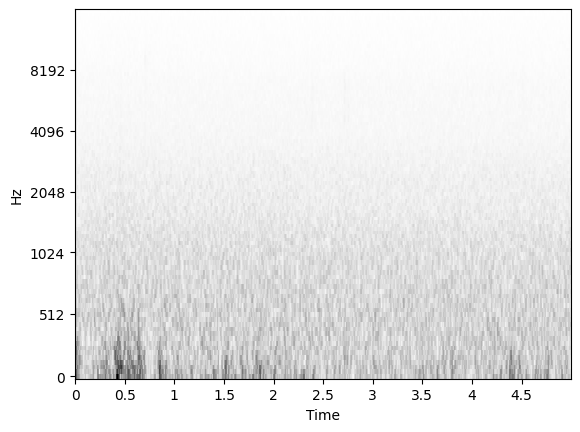

rank        : 2
source file : 12-ZEBRA/Data/12-ZEBRA-JD_20230616_010000.wav
offset_s    : 115.00
score       : 4.50
--------------------------------------------------------------------------------
Results Page: 0 / 16


Button(description='Prev Page', style=ButtonStyle())

Button(description='Next Page', style=ButtonStyle())

In [28]:
# search for embeddings similar to that of a westan recording

top_k = 50 

target_score = None

metric = 'mip' 

random_sample = False

ds = project_state.create_embeddings_dataset(shuffle_files=True)
results, all_scores = search.search_embeddings_parallel(
    ds, tar_query,
    hop_size_s=bootstrap_config.embedding_hop_size_s,
    top_k=top_k, target_score=target_score, score_fn=metric,
    random_sample=random_sample)

samples_per_page = 3
page_state = display.PageState(
    np.ceil(len(results.search_results) / samples_per_page))

display.display_paged_results(
    results, page_state, samples_per_page,
    project_state=project_state,
    embedding_sample_rate=project_state.embedding_model.sample_rate,
    exclusive_labels=False,
    checkbox_labels=[],
    max_workers=5,
)

In [255]:
# try to find differences between two different "similar" recordings
dist = np.sqrt(sum((xc_query - tar_query) **2))
print(dist)
print(tar_query.shape)
print(xc_query.shape)

3.864191379886054
(1280,)
(1280,)


In [273]:
classified[classified['filename'] == '1-MYOTIS/Data/11-MYOTIS_20230611_180000.wav']

,filename,timestamp_s,label,logit


In [206]:
# plot hist of westan logits from classifier
westan_classified = classified[classified['label'] == 'westan']

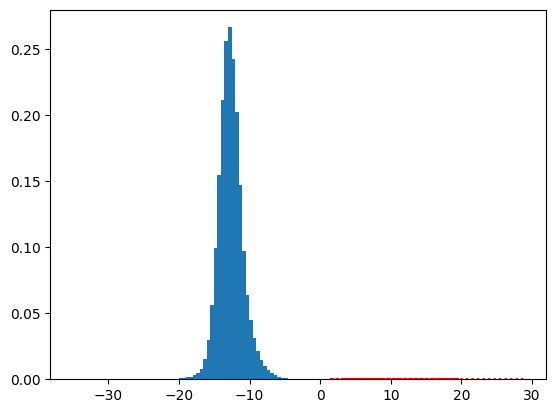

In [214]:
westan_above_zero = westan_classified[westan_classified['logit'] > 0]
plt.hist(westan_classified['logit'], bins=128, density=True)
plt.plot(westan_above_zero['logit'], [0] * len(westan_above_zero['logit']), 'r:')
plt.show()

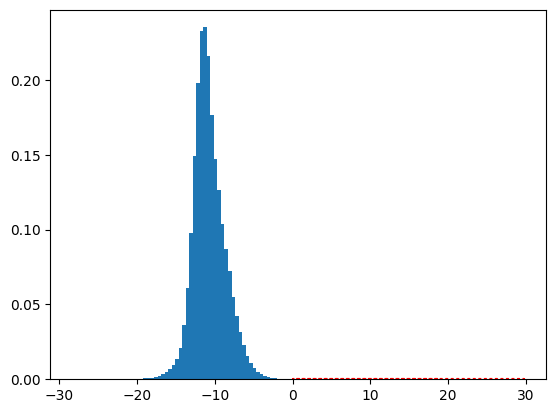

In [238]:
# plot hist of logits for a certain species
species_classified = classified[classified['label'] == 'daejun']
species_classified_above_zero = species_classified[species_classified['logit'] > 0]
plt.hist(species_classified['logit'], bins=128, density=True)
plt.plot(species_classified_above_zero['logit'], [0] * len(species_classified_above_zero['logit']), 'r:')
plt.show()

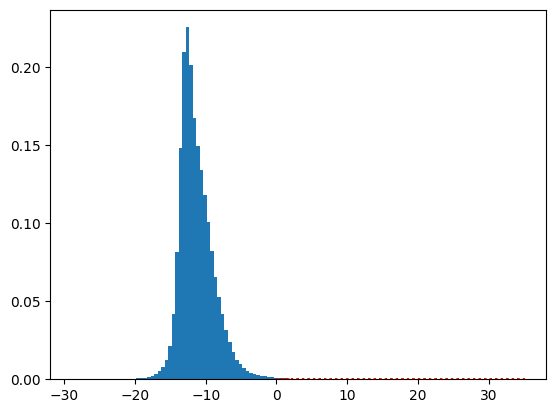

In [25]:
# plot hist of logits for a certain species
species_classified = classified[classified['label'] == 'daejun']
species_classified_above_zero = species_classified[species_classified['logit'] > 0]
plt.hist(species_classified['logit'], bins=128, density=True)
plt.plot(species_classified_above_zero['logit'], [0] * len(species_classified_above_zero['logit']), 'r:')
plt.show()

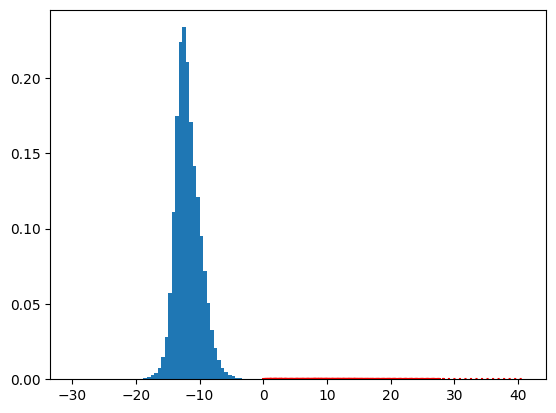

In [241]:
# plot hist of logits for a certain species
species_classified = classified[classified['label'] == 'stejay']
species_classified_above_zero = species_classified[species_classified['logit'] > 0]
plt.hist(species_classified['logit'], bins=128, density=True)
plt.plot(species_classified_above_zero['logit'], [0] * len(species_classified_above_zero['logit']), 'r:')
plt.show()

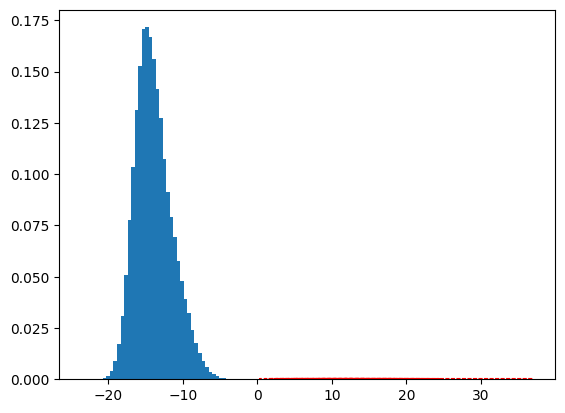

In [242]:
# plot hist of logits for a certain species
species_classified = classified[classified['label'] == 'herwar']
species_classified_above_zero = species_classified[species_classified['logit'] > 0]
plt.hist(species_classified['logit'], bins=128, density=True)
plt.plot(species_classified_above_zero['logit'], [0] * len(species_classified_above_zero['logit']), 'r:')
plt.show()

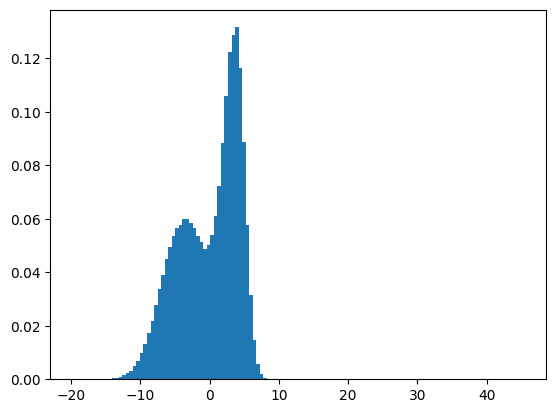

In [209]:
# plot hist of logits for unknown
species_classified = classified[classified['label'] == 'unknown']
plt.hist(species_classified['logit'], bins=128, density=True)
plt.show()